# 1. 空间组学数据加载，并导入到anndata

空间转录组的测试数据集还是使用Wu 2021的对应CID 4535先进行空间组学数据质控与分析

In [1]:
# 原本希望使用scanpy.read_visium()直接加载数据集的，但是这个数据格式不符合要求，只能重新手动加载
import scanpy as sc
import pandas as pd
import anndata as ad
import numpy as np
from scipy.io import mmread
from pathlib import Path
from IPython.display import display, Markdown

data_dir = Path("../../data/raw/wu2021_visium")
counts_dir = data_dir / "filtered_count_matrices/CID4535_filtered_count_matrix"
spatial_dir = data_dir / "spatial/CID4535_spatial"

with open(counts_dir / "matrix.mtx.gz", "rb") as f:
    counts_matrix = mmread(f).T.tocsc()  # 转置为基因 x 细胞的稀疏矩阵

# 导入obs 和 var
barcodes = pd.read_csv(counts_dir / "barcodes.tsv.gz", header=None, sep="\t", compression=None)[0].astype(str)
genes = pd.read_csv(counts_dir / "features.tsv.gz", header=None, sep="\t", compression=None)[0].astype(str)

adata = ad.AnnData(
    X=counts_matrix,
    obs=pd.DataFrame(index=barcodes),
    var=pd.DataFrame({"gene_symbol": genes.to_numpy()}, index=pd.Index(genes, name="gene")),
)
display(adata)
display(adata.obs.head().rename_axis("barcode").reset_index())
display(adata.var.head().rename_axis("gene").reset_index())

/var/folders/xx/bc4p3gnd0l9fw2md4y40twg40000gn/T/ipykernel_66987/357121343.py:15: DeprecationWarning: The default value for `spmatrix` is changing to `False` in v1.20.
             That means the default return type will be a sparse array.
             Unless you use * instead of @, ** for matrix power, or you depend
             on 2D shapes from e.g. `A.sum(axis=0)` it may not matter to you.
             See the spmatrix to sparray migration guide for details.
             https://docs.scipy.org/doc/scipy/reference/sparse.migration_to_sparray.html
             
  counts_matrix = mmread(f).T.tocsc()  # 转置为基因 x 细胞的稀疏矩阵


AnnData object with n_obs × n_vars = 1127 × 19237
    var: 'gene_symbol'
    layers: None (.X)

,barcode
0,AACATTGGTCAGCCGT-1
1,CATCGAATGGATCTCT-1
2,GCGTCCAGCTCGTGGC-1
3,CCAAAGTCCCGCTAAC-1
4,GTTACGGCCCGACTGC-1


,gene,gene_symbol
0,AL627309.1,AL627309.1
1,AL669831.5,AL669831.5
2,LINC00115,LINC00115
3,FAM41C,FAM41C
4,AL645608.1,AL645608.1


# 2. 对齐空间坐标和组织图像与spot条码，并导入作者提供的标签

此时的anndata和单细胞测序的cells信息无异，但在空间组学中，还记录了spot的空间坐标，spot的元数据关系，以及低分辨率与高分辨率的两张图像和其缩放系数json，需要导入整合到anndata中，以便后续使用。

In [2]:
# 导入空间位置信息
pos = pd.read_csv(
    spatial_dir / "tissue_positions_list.csv",
    header=None,
    sep=",",
    compression=None,
    names=["barcode", "in_tissue", "array_row", "array_col", "pxl_row_in_fullres", "pxl_col_in_fullres"],
    index_col="barcode",
)
# 按照adata.obs_names的顺序重新排列pos
pos = pos.loc[adata.obs_names].copy()
for column in pos.columns:
    adata.obs[column] = pos[column].values

adata.obsm["spatial"] = pos[["pxl_col_in_fullres", "pxl_row_in_fullres"]].to_numpy()

# 导入坐标完成
display(adata.obsm["spatial"])

array([[2611, 1390],
       [2721, 1390],
       [3595, 1389],
       ...,
       [5401, 7949],
       [5183, 8140],
       [5237, 8235]], shape=(1127, 2))

In [3]:
# 导入元信息
metadata = pd.read_csv(data_dir / "metadata/CID4535_metadata.csv", index_col=0, header=0)

metadata = metadata.loc[adata.obs_names].copy()

for column in metadata.columns:
    adata.obs[column] = metadata[column]

display(adata.obs[["patientid", "subtype", "Classification", "in_tissue"]].head())
display(adata.obs[["Classification"]].value_counts())

,patientid,subtype,Classification,in_tissue
0,,,,
AACATTGGTCAGCCGT-1,CID4535,ER,Invasive cancer + lymphocytes,1
CATCGAATGGATCTCT-1,CID4535,ER,Invasive cancer + lymphocytes,1
GCGTCCAGCTCGTGGC-1,CID4535,ER,Invasive cancer + lymphocytes,1
CCAAAGTCCCGCTAAC-1,CID4535,ER,Invasive cancer + lymphocytes,1
GTTACGGCCCGACTGC-1,CID4535,ER,Invasive cancer + lymphocytes,1


Classification                                
Invasive cancer                                   418
Invasive cancer + lymphocytes                     361
Stroma                                            169
Uncertain                                          73
Lymphocytes                                        69
Artefact                                           23
Adipose tissue                                      8
Invasive cancer + adipose tissue + lymphocytes      3
Name: count, dtype: int64

In [4]:
# 导入图像
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

library_id = "CID4535"

image_lowres = mpimg.imread(spatial_dir / "tissue_lowres_image.png")

image_hires = mpimg.imread(spatial_dir / "tissue_hires_image.png")
# 记录缩放
with open(spatial_dir / "scalefactors_json.json") as f:
    scalefactors = json.load(f)

adata.uns["spatial"] = {
    library_id: {
        "images": {
            "lowres": image_lowres,
            "hires": image_hires,
        },
        "scalefactors": scalefactors,
    }
}

xy_hires = adata.obsm["spatial"] * scalefactors["tissue_hires_scalef"]

height, width, channels = image_hires.shape
print(f"高分辨率图像：高 {height} × 宽 {width} 像素，{channels} 个通道")
print(f"缩放系数：{scalefactors['tissue_hires_scalef']:.6f}")

高分辨率图像：高 1914 × 宽 2000 像素，3 个通道
缩放系数：0.207297


此时只是在anndata中保存了该图像的数据，但是我们需要观察图像和spot中坐标的映射关系是否正确，并且通过spot的元数据中提供的坐标是否有落在对应组织区域与错位

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


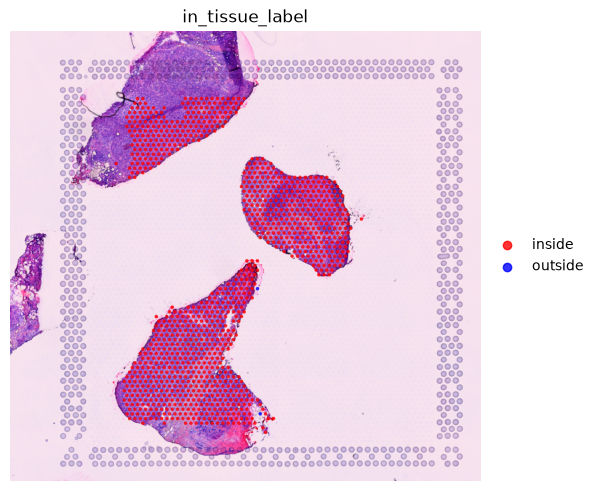

In [5]:
import squidpy as sq
from matplotlib.colors import ListedColormap
# 将spot的元数据叠在hires图像上以检查spot是否有异常

adata.obs["in_tissue_label"] = pd.Categorical(
    adata.obs["in_tissue"].map({1: "inside", 0: "outside"}),
    categories=["inside", "outside"],
)

sq.pl.spatial_scatter(
    adata,
    library_id=library_id,
    img_res_key="hires",
    shape="circle",
    color="in_tissue_label",
    palette=ListedColormap(["red", "blue"]),
    size=1.0,
    alpha=0.8,
    img_alpha=1.0,
    frameon=False,
)

检查完发现大体一致，没什么特别的问题，spot的分布是符合组织分布的。

# 3. 计算质控数据

# 3.1 标记MT基因

In [6]:
# 转换为sparse matrix方便计算
adata.X = adata.X.tocsr()


# 标记并检测mt含量
adata.var["mt"] = adata.var["gene_symbol"].str.startswith("MT-").to_numpy(dtype=bool)

sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

# 统计qc的值
qc_columns = [
    "total_counts",
    "n_genes_by_counts",
    "pct_counts_mt",
]

print(
    "UMI 数不一致的 spot 数：",
    (adata.obs["total_counts"] != adata.obs["nCount_RNA"]).sum(),
)

print(
    "基因数不一致的 spot 数：",
    (adata.obs["n_genes_by_counts"] != adata.obs["nFeature_RNA"]).sum(),
)

display(adata.obs[qc_columns].quantile([0, 0.01, 0.05, 0.5, 0.95, 0.99, 1]))

UMI 数不一致的 spot 数： 0
基因数不一致的 spot 数： 0


,total_counts,n_genes_by_counts,pct_counts_mt
0.00,665.00,510.00,1.687852
0.01,880.44,651.54,2.278779
0.05,3344.10,1882.20,3.055655
0.50,12836.00,4513.00,6.551032
0.95,25047.90,6372.20,13.370898
0.99,35826.80,7192.18,16.388820
1.00,53161.00,8803.00,22.983381


/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


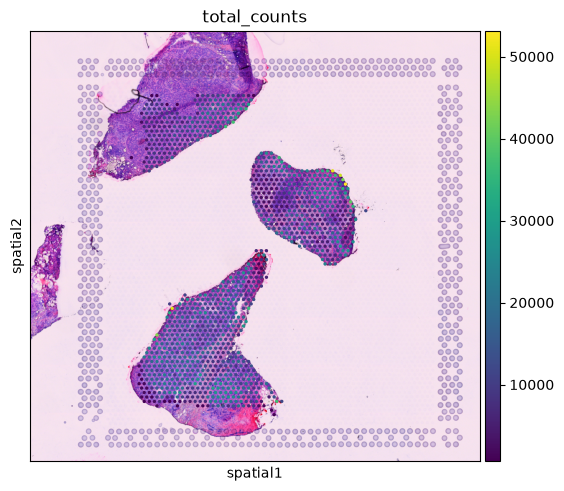

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


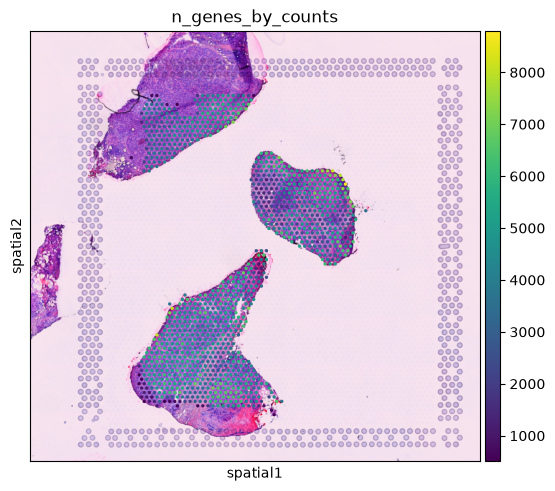

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


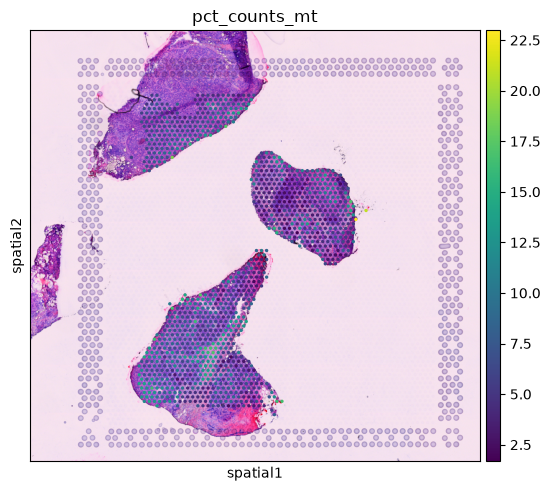

In [7]:
# 绘图核验， 分开画图不然不好看
for qc_column in qc_columns:
    sq.pl.spatial_scatter(adata, library_id=library_id, color=qc_column, colorbar=True)

    plt.show()

# 记录下spot统计，并保存过滤前的空间对象

In [8]:
# spot的汇总统计报告表格
# 记录多少个在标记为组织外的spot
adata.obs["review_outside_tissue"] = adata.obs["in_tissue"].eq(0)

# 记录识别
adata.obs["review_artefact"] = adata.obs["Classification"].eq("Artefact").fillna(False)

# 记录缺失通路的
adata.obs["review_missing_pathology"] = adata.obs["Classification"].isna()

review_columns = [
    "review_outside_tissue",
    "review_artefact",
    "review_missing_pathology",
]

display(adata.obs[review_columns].sum())

# 所有待核的spot的汇总
needs_review = adata.obs[review_columns].any(axis=1)

display(
    adata.obs.loc[
        needs_review,
        ["Classification", "in_tissue"] + qc_columns,
    ]
)

review_outside_tissue        2
review_artefact             23
review_missing_pathology     3
dtype: int64

,Classification,in_tissue,total_counts,n_genes_by_counts,pct_counts_mt
0,,,,,
ATCTGCACCTCTGCGA-1,Artefact,1,12086,3508,20.966407
TTAAACTCGAATTCAT-1,Artefact,1,3135,1878,4.561404
TACTTTACTGAGCCGG-1,Artefact,1,13263,4614,12.651738
GCTTGGATCGATTAGG-1,Artefact,1,24670,5657,22.983381
TTACGGATGGTTCGAG-1,Artefact,1,5324,2676,5.822690
GCTTTCAGAGGAGGTG-1,Artefact,1,3363,2032,4.430568
TCTTCCCATGGGCACA-1,Artefact,1,7768,3666,5.020597
AACTCTCAATAGAGCG-1,Artefact,1,2153,1268,5.294937
TCTGAATTCCGTACAA-1,Artefact,1,5084,2543,4.799371


# 4. 绘图确认在文中确认的标签在图像中的分布

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


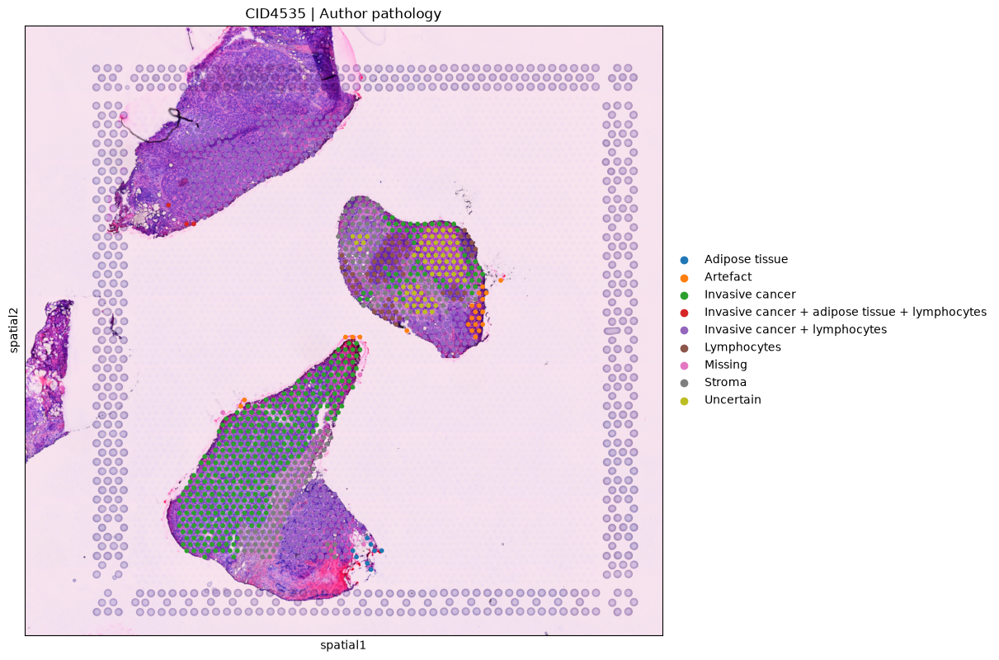

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


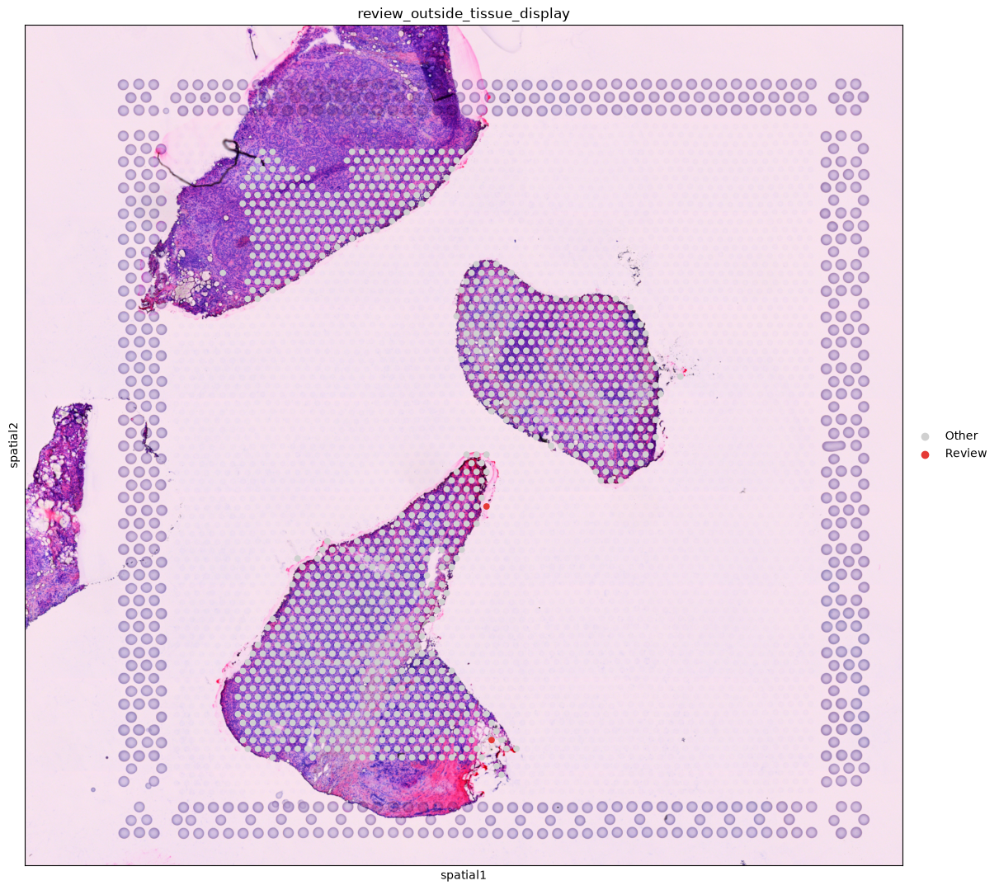

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


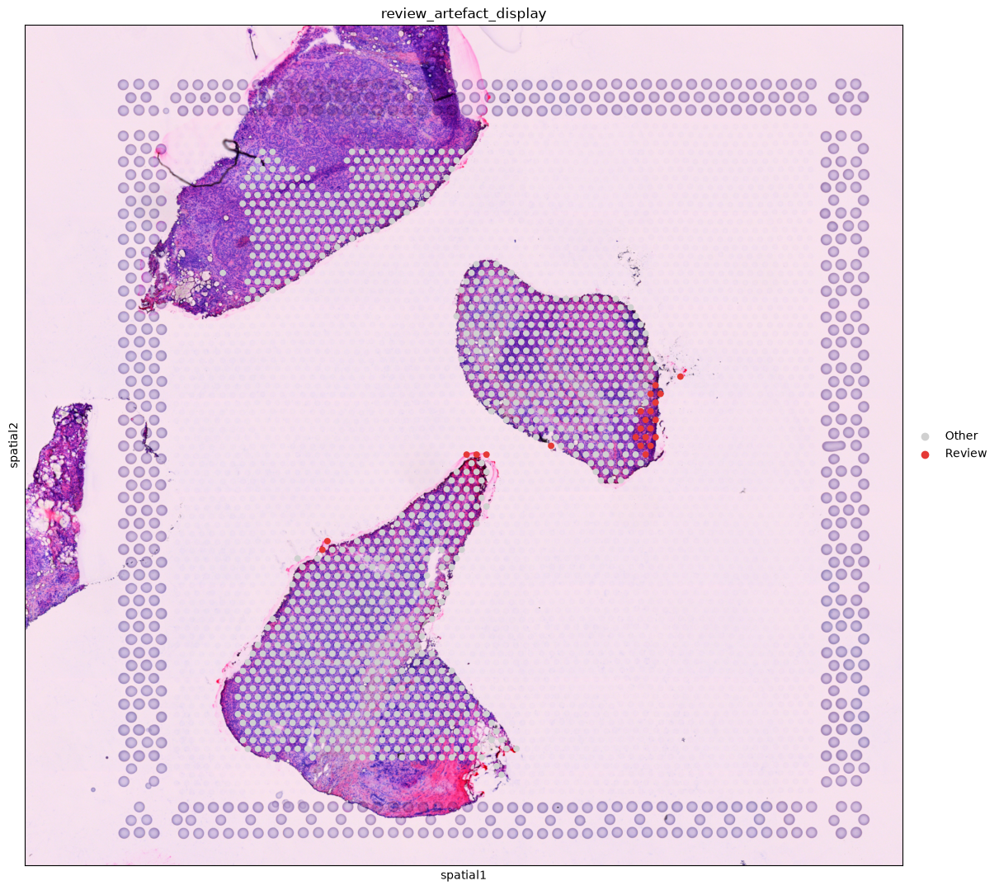

/Users/georicl/Documents/sc_sncell_github/.venv/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)


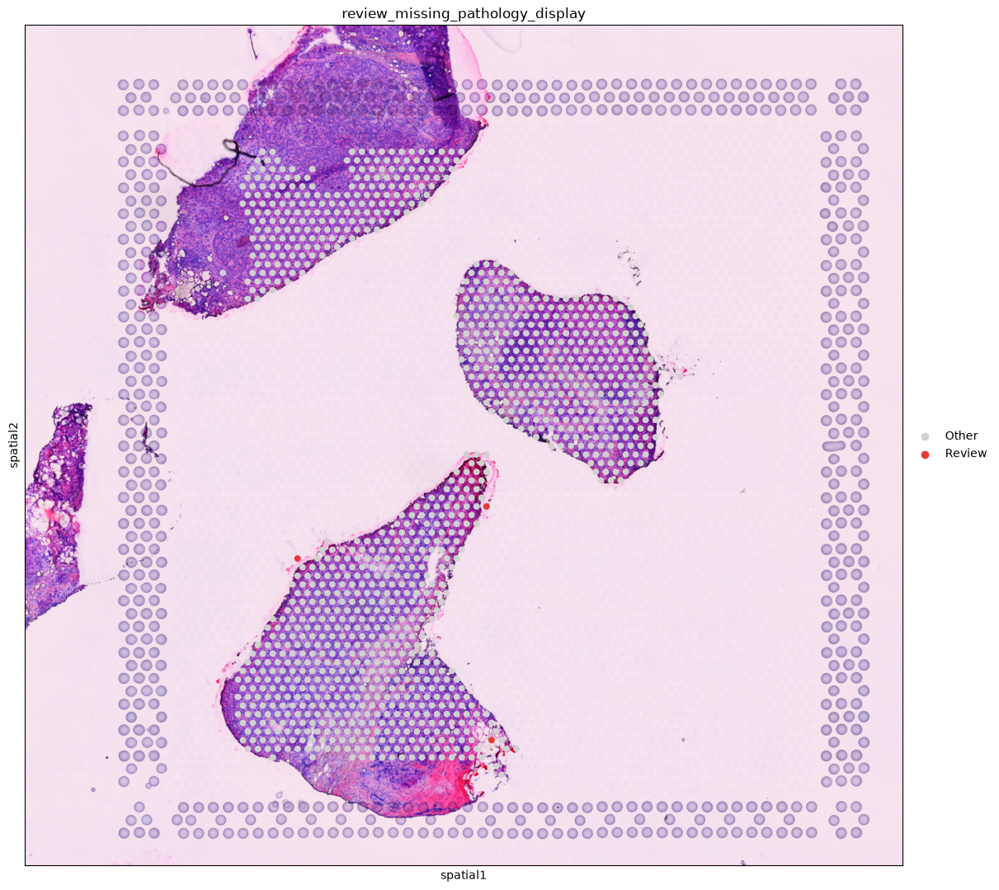

In [9]:
# 分类标签
adata.obs["pathology_display"] = adata.obs["Classification"].astype("string").fillna("Missing").astype("category")

sq.pl.spatial_scatter(
    adata,
    library_id=library_id,
    color="pathology_display",
    figsize=(12, 12),
    title="CID4535 | Author pathology",
)

plt.show()
plt.close("all")


review_panels = {
    "review_outside_tissue": "Outside tissue",
    "review_artefact": "Artefact",
    "review_missing_pathology": "Missing pathology",
}

for column, label in review_panels.items():
    display_column = f"{column}_display"

    adata.obs[display_column] = pd.Categorical(
        adata.obs[column].map(
            {
                False: "Other",
                True: "Review",
            }
        ),
        categories=["Other", "Review"],
    )

    # 构建映射，把需要人工检测的设为红色看看其在组织的分布
    sq.pl.spatial_scatter(
        adata,
        library_id=library_id,
        color=display_column,
        palette=ListedColormap(["#D0D0D0", "#E53935"]),
        figsize=(12, 12),
    )

    plt.show()
    plt.close("all")

# 5. 根据组织与病理标记完成空间质控

结合组织图像检查，作者标记为 Artefact 的 spot 主要位于组织碎片或边缘区域；两个组织外 spot 也位于组织边缘。当前没有发现表达矩阵、空间坐标与组织图像整体错位。

In [10]:
# 只要是不在组织内，或者存在审核缺陷的spot全部放弃
adata.obs["exclude_outside_tissue"] = adata.obs["in_tissue"].eq(0)
adata.obs["exclude_artefact"] = adata.obs["Classification"].eq("Artefact").fillna(False)

adata.obs["exclude_from_analysis"] = adata.obs["exclude_outside_tissue"] | adata.obs["exclude_artefact"]

# 但是缺失病例数据本身不影响表达数据
adata.obs["exclude_from_pathology_analysis"] = adata.obs["Classification"].isna() | adata.obs["Classification"].isin(
    ["Artefact", "Uncertain"]
)
print("过滤前 spot 数：", adata.n_obs)
print("组织外 spot 数：", adata.obs["exclude_outside_tissue"].sum())
print("Artefact spot 数：", adata.obs["exclude_artefact"].sum())
print("实际排除 spot 数：", adata.obs["exclude_from_analysis"].sum())

过滤前 spot 数： 1127
组织外 spot 数： 2
Artefact spot 数： 23
实际排除 spot 数： 25


In [11]:
# 保存被排除后的spot的编码， 并且创建过滤后的对象
excluded_spots = adata.obs.loc[
    adata.obs["exclude_from_analysis"],
    [
        "Classification",
        "in_tissue",
        "total_counts",
        "n_genes_by_counts",
        "pct_counts_mt",
        "exclude_outside_tissue",
        "exclude_artefact",
    ],
].copy()

adata_qc = adata[~adata.obs["exclude_from_analysis"]].copy()

for column in adata_qc.obs.select_dtypes(include="category").columns:
    adata_qc.obs[column] = adata_qc.obs[column].cat.remove_unused_categories()

print("过滤后对象：", adata_qc)
print("过滤后 spot 数：", adata_qc.n_obs)


过滤后对象： AnnData object with n_obs × n_vars = 1102 × 19237
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'nCount_RNA', 'nFeature_RNA', 'subtype', 'patientid', 'Classification', 'in_tissue_label', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'review_outside_tissue', 'review_artefact', 'review_missing_pathology', 'pathology_display', 'review_outside_tissue_display', 'review_artefact_display', 'review_missing_pathology_display', 'exclude_outside_tissue', 'exclude_artefact', 'exclude_from_analysis', 'exclude_from_pathology_analysis'
    var: 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial', 'in_tissue_label_colors', '

In [12]:
# 最终汇总与记录

filter_summary = pd.DataFrame(
    {
        "n_spots": [
            adata.n_obs,
            int(adata.obs["exclude_outside_tissue"].sum()),
            int(adata.obs["exclude_artefact"].sum()),
            int(adata.obs["exclude_from_analysis"].sum()),
            adata_qc.n_obs,
            int(adata_qc.obs["Classification"].isna().sum()),
        ]
    },
    index=[
        "before_filtering",
        "outside_tissue",
        "author_artefact",
        "excluded_union",
        "after_filtering",
        "retained_missing_pathology",
    ],
)

output_dir = data_dir.parent.parent / "processed" / "CID4535_spatial"
output_dir.mkdir(parents=True, exist_ok=True)

adata_qc.obs.index.name = "barcode"
excluded_spots.index.name = "barcode"

# 保存QC后的anndata为最终结果，用于后续的边界检测
adata_qc.write_h5ad(
    output_dir / "spatial_qc_filtering.h5ad"
)

adata_qc.obs.to_csv(
    output_dir / "spot_qc_filtering.csv"
)

excluded_spots.to_csv(
    output_dir / "excluded_spots_qc.csv"
)

filter_summary.to_csv(
    output_dir / "spatial_qc_filter_summary.csv"
)